# Butterfly Notebook

To test visualization, training and prediction.

The objective of this notebook is to give a starting point to play with the data and detectron2.

Get an understanding of what detectron2 does, what are the output and how to use them.

    1- Introduction
    2- Setup the librabry and model
    3- Play


## 1- Introduction

Here I will briefly explain how to use this tool. The intent is simply to to give a help start.
For a more general adn detail introduction refere to the documentation and tutorial here:

+ documentation : https://detectron2.readthedocs.io/en/latest/index.html
+ tutorial : https://detectron2.readthedocs.io/en/latest/tutorials/index.html
+ tutorial colab https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5

Detectron is a tool base on deep learning to perform tasks like segmentation, landmark detection and other related tasks. In the tutorial we will simply talk about segmentation. We will use butterfly data that contained a color palette that we want to automatically detect.
In deep learning there are 2 phases :

    + Train : for the train refere to the notebook butterfly_train.ipnb
    + Inference : That is the focus of this tutorial/starter
    
What you need to know/understand

    1- Model :There a model that we have train previously with training data which a pair of an image and the annotation of the objects to detect
    2- Annotation: in case of segmentation is list point (x,y) that enclose the class object to detect
    3- Class object: categories of object for example : a person, a cat, a butterfly, a balloon...
    4- Instances: in this case we can detect several instance of the same object. For example a image can contain several persons, several ballon and each the instance can identify.
    5- bounding box : the small rectangle that encapsulates an object


## Section

    1- Import : libraries required, nothing understand, just [ctrl][enter] to execute the cell
    2- Config and Data import: This section import configuration files to set thing right. 
       It will use as well files used during the training that will help visualize and understand.
       In this section you need to set the path of few files.
    3- 

## 1- Import

In [10]:
import torch
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import json, random, os, sys, yaml, pathlib, cv2
import numpy as np
import pandas as pd
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data.datasets import register_coco_instances
from detectron2.data import MetadataCatalog, Metadata, DatasetCatalog
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
# to visualize
from PIL import Image, ImageDraw
from IPython.display import display, clear_output

## 2- Config and Data import

In this section we have feew function to import the configuration file for registering the data.
We then sort data that have been use for the training and the that need prediction
As well, we construct a metadata object useful for visualization

What you need to do here:

    1- Set the path of config_data : example this is given the parent folder
    2- Set the path of data_prediction_location
    3- Execute the cells
    4- Mess around and display the variable to see what they look like
    
Variable to understand :

    1- annotation_prefix : location of the files containing annotations used for training (not absolutely necessary here). The annotations are in a specific format called cocojson. In those files you can find the names of the images uses, the annotations and the name of the categories
    2- dataset_json par of the configuration not important
    3- data_prefix : location where the images are store
    4- labels_list : list of the classes name here: pallette_square, top_left, top_right, bot_left, bot_right
    5- DatasetCatalog is an object containing registred annotations load from the annotation files.
    use DatasetCatalog to get a list of the annotation and DatasetCatalog.get('annotation_name') to check what is in  the registred annotation (basically annotations 

In [11]:
# Indicate the location of config file and location of data to predict
config_data = ('/home/thibault/Documents/Project/Detectron2_dev/Butterfly_dev/config/config_training.json')
data_prediction_location = '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/'

In [12]:
# Helper function to :
# Import config file which contains the data and anotation location 
# Register the train data so we can play with data, distinguish train and to be predicted
# Create metadata object for the visualization

def import_config(config_data):

    config_file = json.load(open(config_data))

    #ENHANCE = config_file['ENHANCE']
    annotation_prefix = config_file['annotation_prefix']
    dataset_json = config_file['dataset_json']
    data_prefix = config_file['data_prefix']
    labels_file = config_file['labels']
    labels_f = open(labels_file, 'r')
    data = labels_f.read()
    labels_list = [l for l in data.split("\n") if l != '']

    return annotation_prefix, dataset_json, data_prefix, labels_list  # , ENHANCE


def register_data(config_data):

    annotation_prefix,\
        dataset_json, prefix,\
        labels_list = import_config(config_data)

    mapping = {i+1: i for i in range(len(labels_list))}
    conf = json.load(open(dataset_json))
    metadata = None  # Need it in outer block for reuse
    train = []

    for img_dir in conf.keys():
        #ims = f'{prefix}{img_dir}'
        ims = os.path.join(prefix, img_dir)
        for dataset in conf[img_dir]:
            json_file = os.path.join(annotation_prefix, dataset)
            #json_file = f'datasets/{dataset}'
            name = dataset.split('.')[0]
            train.append(name)
            register_coco_instances(name, {}, json_file, ims)

    return train

def create_metadata(name_dataset, labels_list):

    mapping = {i+1: i for i in range(len(labels_list))}
    metadata = MetadataCatalog.get(name_dataset) \
        .set(thing_classes=labels_list,\
             thing_dataset_id_to_contiguous_id=mapping)

    return metadata

In [14]:
# Create what you need the rest
_,_, _, labels_list = import_config(config_data)
train = register_data(config_data)
metadata = create_metadata(train[0], labels_list)

AssertionError: Dataset '1st-set-_labels_2022-04-13-10-05-59' is already registered!

In [15]:
# Create the list of image used in the training
list_image_train = [d['file_name'] for t in train for d in DatasetCatalog.get(t) ]

[05/04 19:15:37 d2.data.datasets.coco]: Loaded 10 images in COCO format from /home/thibault/Documents/Project/Data_test/Butterfly_palette/Color_palette/1st-set-_labels_2022-04-13-10-05-59.json
[05/04 19:15:37 d2.data.datasets.coco]: Loaded 10 images in COCO format from /home/thibault/Documents/Project/Data_test/Butterfly_palette/Color_palette/2nd-set-_labels_2022-04-13-10-05-59.json
[05/04 19:15:37 d2.data.datasets.coco]: Loaded 10 images in COCO format from /home/thibault/Documents/Project/Data_test/Butterfly_palette/Color_palette/3rd-set-_labels_2022-04-13-10-05-59.json
[05/04 19:15:37 d2.data.datasets.coco]: Loaded 10 images in COCO format from /home/thibault/Documents/Project/Data_test/Butterfly_palette/Color_palette/4th-set-_labels_2022-04-13-10-05-59.json
[05/04 19:15:37 d2.data.datasets.coco]: Loaded 10 images in COCO format from /home/thibault/Documents/Project/Data_test/Butterfly_palette/Color_palette/5th-set-_labels_2022-04-13-10-05-59.json


In [9]:
DatasetCatalog.get(train[0])

[05/04 19:08:36 d2.data.datasets.coco]: Loaded 10 images in COCO format from /home/thibault/Documents/Project/Data_test/Butterfly_palette/Color_palette/1st-set-_labels_2022-04-13-10-05-59.json


[{'file_name': '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/138154_DR.JPG',
  'height': 6000,
  'width': 4000,
  'image_id': 1,
  'annotations': [{'iscrowd': 0,
    'bbox': [18.56763925729428,
     15.915119363395227,
     2371.352785145889,
     1607.427055702918],
    'category_id': 0,
    'segmentation': [[66.31299734747996,
      15.915119363395227,
      18.56763925729428,
      1400.53050397878,
      2270.557029177719,
      1623.3421750663133,
      2389.920424403183,
      206.89655172413796]],
    'bbox_mode': <BoxMode.XYWH_ABS: 1>},
   {'iscrowd': 0,
    'bbox': [137.9310344827585,
     1058.3554376657826,
     262.59946949602124,
     230.76923076923094],
    'category_id': 1,
    'segmentation': [[169.76127320954893,
      1058.3554376657826,
      137.9310344827585,
      1249.3368700265253,
      392.57294429708213,
      1289.1246684350135,
      400.53050397877973,
      1066.3129973474802]],
    'bbox_mode': <BoxMode.XYWH_AB

In [16]:
# Get list of image for prediction
import glob
#list of image in the whole folder
list_image=glob.glob(os.path.join(data_prediction_location,'*'))

# remove image used in the train
list_predict = [im_path for im_path in list_image if im_path not in list_image_train]

print(f'Total number of image is {len(list_image)}, number of images that need prediction is {len(list_predict)}')

Total number of image is 149, number of images that need prediction is 99


In [17]:
# Display the first n image_path from the list
list_predict[:4]

['/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/eguarica_6_VR.JPG',
 '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/eeprimularis_4_DR.JPG',
 '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/eguarica_5_VR.JPG',
 '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/esara_5_VR.JPG']

## 2- Prediction

### 1- Setup the model



In [20]:
# set up the model
from detectron2 import model_zoo
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
cfg.MODEL.DEVICE = 'cpu'
predictor = DefaultPredictor(cfg)

### 2- Test and visualization


In [21]:
from detectron2.utils.visualizer import ColorMode
def visualize_prediction(image_path,predictor):
    '''
    Visualize the prediction and output the instances object containing all the "metadata" information
    box, mask, number of instance, classes...
    '''
    im = cv2.imread(image_path) # im = image array for numpy (h,w,3)
    print(image_path)
    output = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(output["instances"].to("cpu"))
    display(Image.fromarray(out.get_image()[:, :, ::-1]))
    

/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/141276_VR.JPG


/home/thibault/anaconda3/envs/gen_metadata_dev/lib/python3.9/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


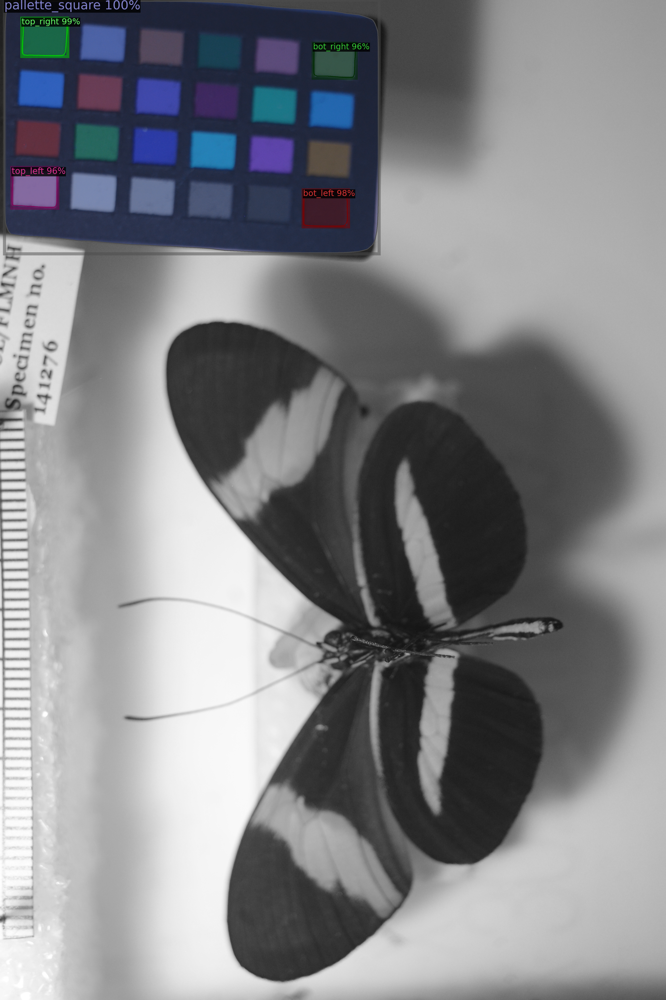

In [22]:
# Visualize Random set of images from the list_predict
image_num = 1
for d in random.sample(list_predict, image_num): 
    visualize_prediction(d, predictor)
    

/home/thibault//Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/mplesseni_5_DR.JPG


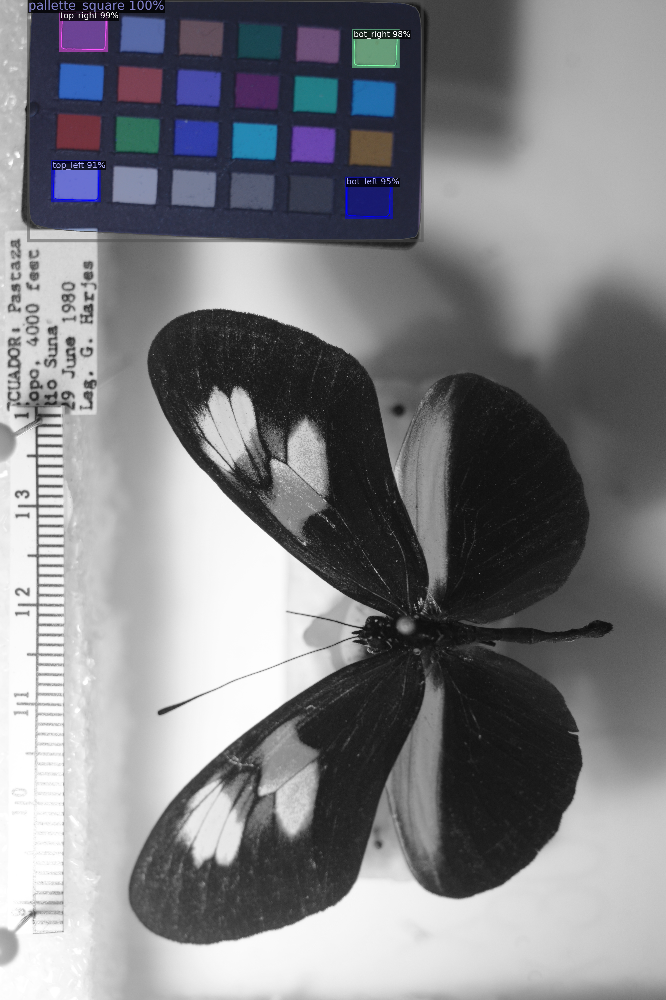

In [42]:
# Visualize a specifc image using the image_path

image_path = "/home/thibault//Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/mplesseni_5_DR.JPG"
visualize_prediction(image_path,predictor)

### 3- Predict and extract the metadata

In this section we have couple of function to extract different information contained in the prediction.

The output "output" can be generated by 

    1- Pedictor "output = predictor(im)" where im is image array (h,w,c) 

    2- function visualize_prediction(image_path) : output = visualize_prediction(image_path)
    
    3- function just_predict : output = just_predict(image_path, predictor)


The output is an instance_object create by detectron2 framework. More info on the structure of output on the documentation https://detectron2.readthedocs.io/en/latest/index.html

Or you can use the following function to play with the 'output'
to get the name of the classes : "type of objects detected" can be access by 

```
instances = output['instances']
instances.get_fields()

```


In [23]:
def just_predict(image_path, predictor):
    '''
    Just predict the classes in the image
    the structure of output is an instances object
    check detectron2 documentation
    '''
    im = cv2.imread(image_path) # im = image array for numpy (h,w,3)
    output = predictor(im) 
    return output


def get_classes_dict(metadata):
    '''
    Create a dictionnary like this : 
    {'pallette_square': 0, 'top_left': 1, 'top_right': 2,'bot_left': 3, 'bot_right': 4}
    This function is not necessary but it reuse the metadata so it automatically create 
    the dictionnary from the configuration files
    '''
    dict_ = metadata.thing_dataset_id_to_contiguous_id
    class_ = metadata.thing_classes
    dict_id_classes = {class_[value]:value for value, k in enumerate(dict_)}
    return dict_id_classes

def get_class(output, dict_id_classes, class_name):
    
    '''
    Get the instance of class object (class_name: from the dict_id_classes)
    
    '''
    instance_index = dict_id_classes[class_name]
    instances = output['instances']
    class_object = instances[instances.pred_classes == instance_index]
    
    return class_object

def get_fields(class_object):
    
    '''
    Create a dictionnary with
    predection box, box center, prediction mask and score
    If their several instance for class we take the instance of the higest score
    If the class does exist (len(instance)=0) return enmplyt value
    '''
    
    dict_ ={}
    
    if len(class_object) >=1:
        
        index_max = np.argmax(class_object.scores.cpu().numpy()).tolist()
        dict_ ['pred_box'] = class_object.pred_boxes.tensor.cpu().numpy()[index_max].tolist()
        #dict_ ['pre_mask'] = class_object.pred_masks.cpu().numpy()[index_max]
        dict_ ['score'] = class_object.scores.cpu().numpy()[index_max]
        dict_ ['center']= class_object.pred_boxes.get_centers().cpu().numpy()[index_max].tolist()
        #dict_ ['pre_mask'] = class_object.pred_masks.cpu().numpy()[index_max]    
    return dict_

def get_seg_metadata(metadata, output):
    '''
    Combine the metadata from the segmentation (mask, bbox) for each class
    '''
    
    dict_id_classes = get_classes_dict(metadata)
    
    dict_result = {}
    for index, class_name in enumerate(dict_id_classes):
        
        class_object = get_class(output, dict_id_classes, class_name)
        dict_result[class_name] = get_fields(class_object)
        
    return dict_result

def Create_Result(image_path, predictor):
    
    output = just_predict(image_path, predictor)
    dict_id_classes = get_classes_dict(metadata)
    
    return get_seg_metadata(metadata, output)

def get_centers(class_object):
    
    '''
    Create a dictionnary with
    Center (x,y) for the instance with the best score (highess probability)
    If their several instance for class we take the instance of the higest score
    If the class does exist (len(instance)=0) return enmplyt value
    '''

    dict_={'x':None,'y':None}
    if len(class_object) >=1:
        
        index_max = np.argmax(class_object.scores.cpu().numpy()).tolist()
        x, y = class_object.pred_boxes.get_centers().cpu().numpy()[index_max].tolist()
        dict_={'x':round(x),'y':round(y)} 
    
    return dict_

def get_bbox(class_object):
    
    '''
    Create a dictionnary with
    Center (x,y) for the instance with the best score (highess probability)
    If their several instance for class we take the instance of the higest score
    If the class does exist (len(instance)=0) return enmplyt value
    '''
    dict_= {}
    if len(class_object) >=1:
        
        index_max = np.argmax(class_object.scores.cpu().numpy()).tolist()
        dict_ ['pred_box'] = class_object.pred_boxes.tensor.cpu().numpy()[index_max].tolist()
    
    return dict_

def get_mask(class_object):
    
    '''
    Create a dictionnary with
    Center (x,y) for the instance with the best score (highess probability)
    If their several instance for class we take the instance of the higest score
    If the class does exist (len(instance)=0) return enmplyt value
    '''
    
    dict_= {}
    if len(class_object) >=1:
        
        index_max = np.argmax(class_object.scores.cpu().numpy()).tolist()
        dict_ ['pre_mask'] = class_object.pred_masks.cpu().numpy()[index_max] 
    
    return dict_
    
def get_4_color_center(metadata, output):
    
    # Classes we want
    dict_id_classes = {'top_left': 1, 'top_right': 2,'bot_left': 3, 'bot_right': 4}
    dict_result = {}
    for index, class_name in enumerate(dict_id_classes):
        
        class_object = get_class(output, dict_id_classes, class_name)
        dict_result[class_name] = get_centers(class_object)
    
    return dict_result

def dict_to_csv(result,output_csv ):
    
    df = pd.DataFrame.from_dict(result).T
    df.to_csv(output_csv, index=True)
    

In [24]:
# Choose an image
image_path = '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/eeprimularis_6_VR.JPG'#list_predict[0]
# preddict
output = just_predict(image_path, predictor)


In [55]:
# create result : 4 corners center
result = get_4_color_center(metadata, output)
result

{'top_left': {'x': None, 'y': None},
 'top_right': {'x': 447, 'y': 141},
 'bot_left': {'x': 2191, 'y': 1014},
 'bot_right': {'x': 2161, 'y': 144}}

In [85]:
# save the data in a csv file 
output = 'Foru_corners.csv'
dict_to_csv(result,output_csv )

In [65]:
#Check the position of the center for specific color_square
# draw a square in the middle of the color_square
# Choose from 'top_left' 'top_right','bot_left', 'bot_right'
color_square = 'top_left'

i = cv2.imread(image_path)
i = Image.fromarray(i)#out.get_image()[:, :, ::-1])
#i = Image.open(image_path)
draw = ImageDraw.Draw(i)
x0,y0 = list(get_4_color_center(metadata, output)[color_square].values())

if not (x0 is None and y0 is None):
    xy= [(x0-10,y0-10), (x0+10,y0+10)] # Coordinate of a square (top_righ,bottom_left)
    draw.rectangle(xy, fill='red', outline=None, width=3)
    draw.point((26, 26), fill='yellow')
    display(i)

### 4- Play and Understand the output

Few examples to help explore the data contained in the prediction results


In [ ]:
def just_predict(image_path, predictor):
    '''
    Just predict the classes in the image
    the structure of output is an instances object
    check detectron2 documentation
    '''
    im = cv2.imread(image_path) # im = image array for numpy (h,w,3)
    output = predictor(im) 
    return output

In [24]:
image_path = '/home/thibault/Documents/Project/Data_test/Butterfly_palette/images_full_palette_square/eeprimularis_6_VR.JPG'#list_predict[0]
output = just_predict(image_path, predictor)

In [28]:
print (f'pred classes index {output["instances"].pred_classes}')

pred_classtensor([0, 4, 2, 3])


In [29]:
# choose the first classes (corresponding to pallette_square)
pallette_square_class = output["instances"][0]

In [52]:

print(f'number of instance for pallette_square_class : {len(pallette_square_class)}')
print(f'list of properties {list(pallette_square_class[0].get_fields().keys())}')
print(f'pred_boxes {list(pallette_square_class[0].)}')

number of instance for pallette_square_class : 1
list of properties ['pred_boxes', 'scores', 'pred_classes', 'pred_masks']


In [51]:
list(pallette_square_class[0].get_fields().keys())

['pred_boxes', 'scores', 'pred_classes', 'pred_masks']